In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error
from keras import optimizers

# Prepare Data

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
cloud_cover = preparedata('../prophet_ver2/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


In [4]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [5]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [6]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [7]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [8]:
def plot_test(train,pred):
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(mode = 'lines', x = train['DateTime'], y = train['cloud_cover'], name = 'Train'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['cloud_cover'], name = 'Actual'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['LSTM'], name = 'Predict'))
    fig2.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
    )


    fig2.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=2,
                        label="2.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=3,
                        label="3.zoom",
                        step="day",
                        stepmode="backward"),              

                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig2.show()

In [9]:
def compare_mse_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

# Train/Test Model

In [10]:
train,test = train_test_split(cloud_cover, train_size=0.8, shuffle=False)
print('Train Shape', train.shape)
print('Test Shape', test.shape)

Train Shape (12048, 2)
Test Shape (3013, 2)


In [11]:
train

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
12043,0.647000,2021-12-10 15:19:00
12044,0.654000,2021-12-10 15:20:00
12045,0.654000,2021-12-10 15:21:00
12046,0.578000,2021-12-10 15:22:00


In [12]:
train = train.set_index('DateTime')
test = test.set_index('DateTime')

In [13]:
# X_train, y_train, X_test and y_test
X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,10)

X_train Shape : (12038, 10, 1)
y_train Shape : (12038, 1)
X_test Shape :  (3013, 10, 1)
y_test Shape :  (3013, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [14]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### batch size 32 Add frist layer units = 50 epochs 10 

In [15]:
test1 = test.copy()

In [16]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 9s 10ms/step - loss: 0.0128 - val_loss: 0.0042
Epoch 2/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0029 - val_loss: 0.0036
Epoch 3/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0022 - val_loss: 0.0031
Epoch 4/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0019 - val_loss: 0.0028
Epoch 5/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0017 - val_loss: 0.0026
Epoch 6/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 7/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0013 - val_loss: 0.0024
Epoch 8/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0023
Epoch 9/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0010 - val_loss: 0.002

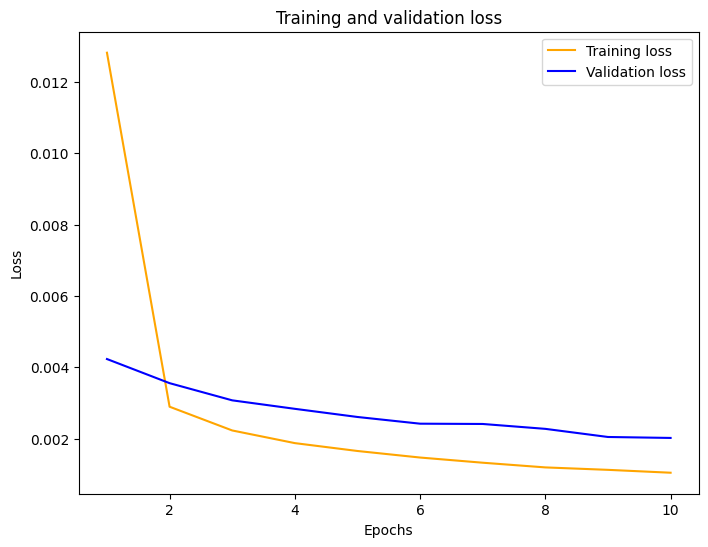

In [17]:
plot_curve(hist_adam)

In [18]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-10 15:24:00,0.538,0.554377
1,2021-12-10 15:25:00,0.588,0.537752
2,2021-12-10 15:26:00,0.566,0.579857
3,2021-12-10 15:27:00,0.562,0.573398
4,2021-12-10 15:28:00,0.612,0.564369
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.167777
3009,2021-12-16 13:59:00,0.169,0.167347
3010,2021-12-16 14:00:00,0.147,0.167881
3011,2021-12-16 14:01:00,0.145,0.153338


In [19]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [20]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_mse_error_unit_50_adam

0.0020086448581532516

In [21]:
mse_data = pd.DataFrame(columns=['Lags' ,'Optimizer', 'Batch_size', 'Learning rate', 'The frist layer', 'The frist layer add Drop out', 'The second layer', 'The second layer add Drop out', 
                                 'The third layer', 'The output layer', 'epochs','mse error'])

data = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_adam}]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_20492\4169939381.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,10,Adam,32,,50,,,,,1,10,0.002009


---

## Optimizer RMSprop

### Add frist layer: units = 50

In [27]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 8s 9ms/step - loss: 0.0060 - val_loss: 0.0038
Epoch 2/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0020 - val_loss: 0.0028
Epoch 3/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 4/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 5/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 7/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 9/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0021

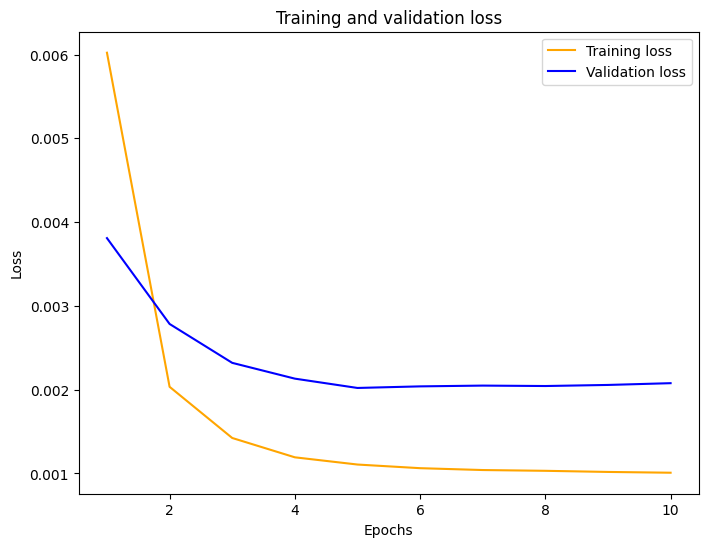

In [28]:
plot_curve(hist_50_rms)

In [29]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-10 15:24:00,0.538,0.554377,0.541929
1,2021-12-10 15:25:00,0.588,0.537752,0.525823
2,2021-12-10 15:26:00,0.566,0.579857,0.579232
3,2021-12-10 15:27:00,0.562,0.573398,0.555564
4,2021-12-10 15:28:00,0.612,0.564369,0.551869
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.167777,0.163795
3009,2021-12-16 13:59:00,0.169,0.167347,0.163711
3010,2021-12-16 14:00:00,0.147,0.167881,0.164669
3011,2021-12-16 14:01:00,0.145,0.153338,0.143877


In [30]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [31]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_rms)

Better MSE value is :  0.0020086448581532516


,Model,MSE error
0,model,0.002009
1,model_1,0.002068


In [32]:
data1 = [{'Lags':10 ,'Optimizer':'RMSprop', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_rms}]

mse_data = mse_data.append(data1,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_20492\1449964364.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,10,Adam,32,,50,,,,,1,10,0.002009
1,10,RMSprop,32,,50,,,,,1,10,0.002068


---

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [33]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
189/189 [==============================] - 8s 13ms/step - loss: 0.0220 - val_loss: 0.0048
Epoch 2/10
189/189 [==============================] - 2s 9ms/step - loss: 0.0036 - val_loss: 0.0045
Epoch 3/10
189/189 [==============================] - 2s 9ms/step - loss: 0.0032 - val_loss: 0.0040
Epoch 4/10
189/189 [==============================] - 2s 9ms/step - loss: 0.0028 - val_loss: 0.0037
Epoch 5/10
189/189 [==============================] - 2s 8ms/step - loss: 0.0024 - val_loss: 0.0034
Epoch 6/10
189/189 [==============================] - 2s 8ms/step - loss: 0.0021 - val_loss: 0.0031
Epoch 7/10
189/189 [==============================] - 2s 8ms/step - loss: 0.0019 - val_loss: 0.0031
Epoch 8/10
189/189 [==============================] - 2s 9ms/step - loss: 0.0018 - val_loss: 0.0028
Epoch 9/10
189/189 [==============================] - 2s 9ms/step - loss: 0.0017 - val_loss: 0.0027
Epoch 10/10
189/189 [==============================] - 2s 9ms/step - loss: 0.0016 - val_loss: 0.002

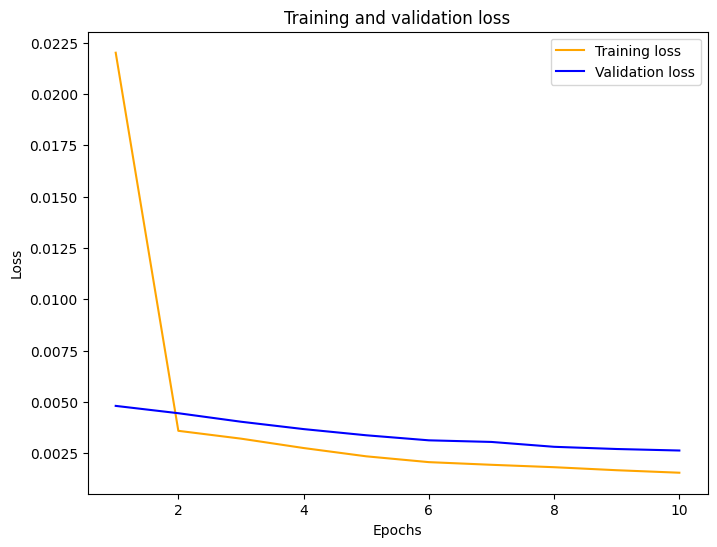

In [34]:
plot_curve(hist_batch_size64)

In [35]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-10 15:24:00,0.538,0.554377,0.541929,0.597988
1,2021-12-10 15:25:00,0.588,0.537752,0.525823,0.566757
2,2021-12-10 15:26:00,0.566,0.579857,0.579232,0.565480
3,2021-12-10 15:27:00,0.562,0.573398,0.555564,0.562155
4,2021-12-10 15:28:00,0.612,0.564369,0.551869,0.562362
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.167777,0.163795,0.175343
3009,2021-12-16 13:59:00,0.169,0.167347,0.163711,0.174787
3010,2021-12-16 14:00:00,0.147,0.167881,0.164669,0.174797
3011,2021-12-16 14:01:00,0.145,0.153338,0.143877,0.168430


In [36]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [37]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_batch_size64)

Better MSE value is :  0.0020086448581532516


,Model,MSE error
0,model,0.002009
1,model_1,0.002621


In [38]:
data2 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':64, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_batch_size64}]

mse_data = mse_data.append(data2,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_20492\3608671323.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,10,Adam,32,,50,,,,,1,10,0.002009
1,10,RMSprop,32,,50,,,,,1,10,0.002068
2,10,Adam,64,,50,,,,,1,10,0.002621


---

### learning rate 0.1

In [39]:
test2 = test.copy()

#### Add frist layer: units = 50

In [50]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 8s 10ms/step - loss: 0.2777 - val_loss: 0.1215
Epoch 2/10
377/377 [==============================] - 3s 9ms/step - loss: 0.1542 - val_loss: 0.1971
Epoch 3/10
377/377 [==============================] - 3s 7ms/step - loss: 0.1625 - val_loss: 0.0960
Epoch 4/10
377/377 [==============================] - 3s 7ms/step - loss: 0.1709 - val_loss: 0.1791
Epoch 5/10
377/377 [==============================] - 3s 7ms/step - loss: 0.1487 - val_loss: 0.3152
Epoch 6/10
377/377 [==============================] - 3s 7ms/step - loss: 0.1558 - val_loss: 0.1193
Epoch 7/10
377/377 [==============================] - 3s 7ms/step - loss: 0.1556 - val_loss: 0.0945
Epoch 8/10
377/377 [==============================] - 3s 7ms/step - loss: 0.1735 - val_loss: 0.0854
Epoch 9/10
377/377 [==============================] - 2s 7ms/step - loss: 0.1617 - val_loss: 0.0865
Epoch 10/10
377/377 [==============================] - 3s 7ms/step - loss: 0.1613 - val_loss: 0.086

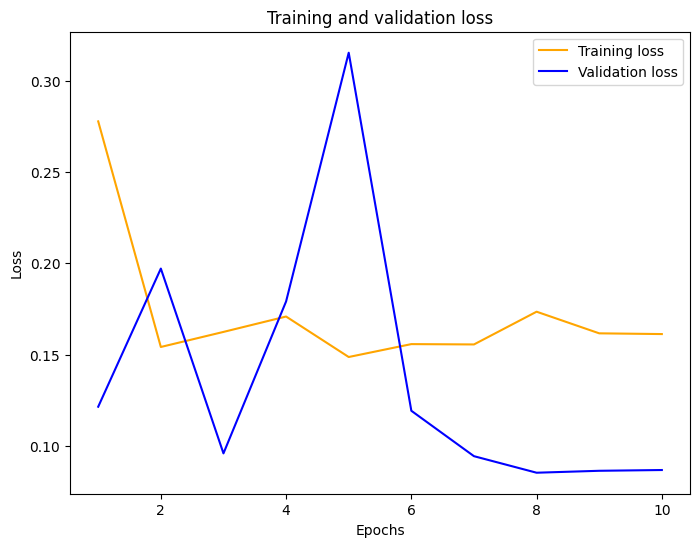

In [51]:
plot_curve(hist_01)

In [52]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-10 15:24:00,0.538,0.327917
1,2021-12-10 15:25:00,0.588,0.327917
2,2021-12-10 15:26:00,0.566,0.327917
3,2021-12-10 15:27:00,0.562,0.327917
4,2021-12-10 15:28:00,0.612,0.327917
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.327917
3009,2021-12-16 13:59:00,0.169,0.327917
3010,2021-12-16 14:00:00,0.147,0.327917
3011,2021-12-16 14:01:00,0.145,0.327917


In [53]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [54]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_01)

Better MSE value is :  0.0020086448581532516


,Model,MSE error
0,model,0.002009
1,model_1,0.086487


In [55]:
data3 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_01}]

mse_data = mse_data.append(data3,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_20492\2167533432.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,10,Adam,32,,50,,,,,1,10,0.002009
1,10,RMSprop,32,,50,,,,,1,10,0.002068
2,10,Adam,64,,50,,,,,1,10,0.002621
3,10,Adam,32,0.1,50,,,,,1,10,0.086487


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [56]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 9s 9ms/step - loss: 0.0136 - val_loss: 0.0023
Epoch 2/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 3/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 4/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 5/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0023
Epoch 6/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 7/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0023
Epoch 8/10
377/377 [==============================] - 2s 7ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 2s 7ms/step - loss: 0.0011 - val_loss: 0.0023
Epoch 10/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0021

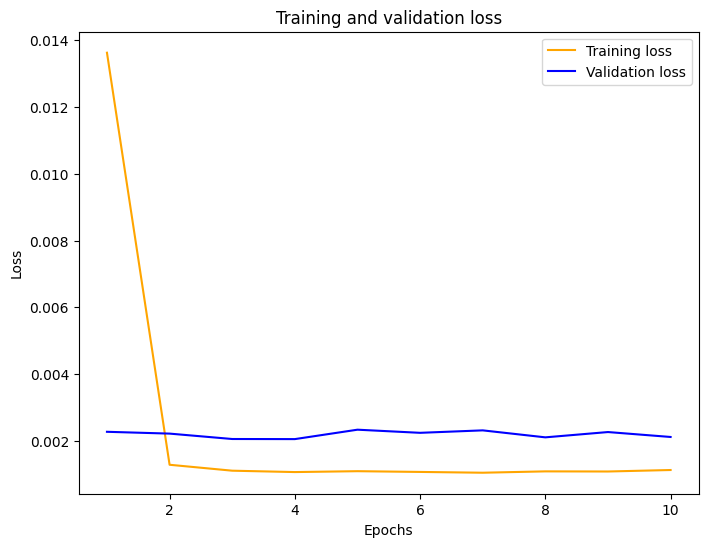

In [57]:
plot_curve(hist_005)

In [58]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-10 15:24:00,0.538,0.327917,0.557475
1,2021-12-10 15:25:00,0.588,0.327917,0.533390
2,2021-12-10 15:26:00,0.566,0.327917,0.596515
3,2021-12-10 15:27:00,0.562,0.327917,0.555517
4,2021-12-10 15:28:00,0.612,0.327917,0.563879
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.327917,0.160701
3009,2021-12-16 13:59:00,0.169,0.327917,0.160836
3010,2021-12-16 14:00:00,0.147,0.327917,0.161907
3011,2021-12-16 14:01:00,0.145,0.327917,0.138723


In [59]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [60]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_005)

Better MSE value is :  0.0020086448581532516


,Model,MSE error
0,model,0.002009
1,model_1,0.002109


In [61]:
data4 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.05, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_005}]

mse_data = mse_data.append(data4,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_20492\1351275556.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,10,Adam,32,,50,,,,,1,10,0.002009
1,10,RMSprop,32,,50,,,,,1,10,0.002068
2,10,Adam,64,,50,,,,,1,10,0.002621
3,10,Adam,32,0.1,50,,,,,1,10,0.086487
4,10,Adam,32,0.05,50,,,,,1,10,0.002109


----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [62]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 9s 9ms/step - loss: 0.0046 - val_loss: 0.0024
Epoch 2/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 3/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 4/10
377/377 [==============================] - 3s 7ms/step - loss: 9.9478e-04 - val_loss: 0.0021
Epoch 5/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 7/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 2s 7ms/step - loss: 0.0010 - val_loss: 0.

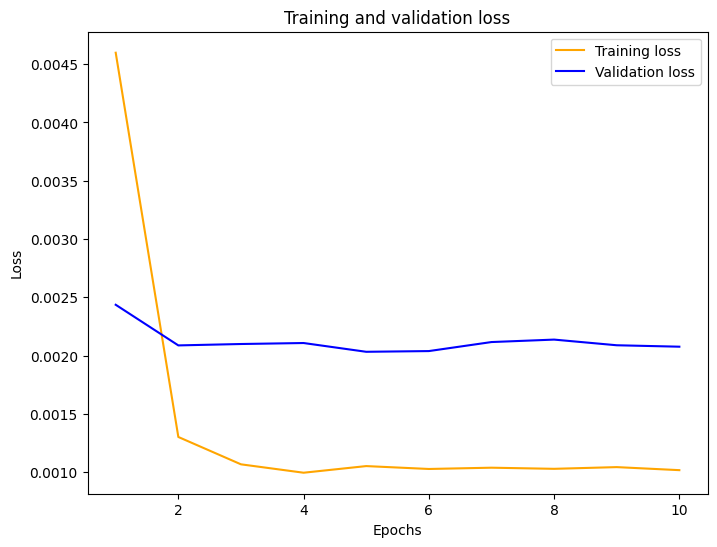

In [63]:
plot_curve(hist_001)

In [64]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-10 15:24:00,0.538,0.327917,0.557475,0.555957
1,2021-12-10 15:25:00,0.588,0.327917,0.533390,0.538442
2,2021-12-10 15:26:00,0.566,0.327917,0.596515,0.596009
3,2021-12-10 15:27:00,0.562,0.327917,0.555517,0.566590
4,2021-12-10 15:28:00,0.612,0.327917,0.563879,0.565519
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.327917,0.160701,0.169782
3009,2021-12-16 13:59:00,0.169,0.327917,0.160836,0.169675
3010,2021-12-16 14:00:00,0.147,0.327917,0.161907,0.170714
3011,2021-12-16 14:01:00,0.145,0.327917,0.138723,0.148532


In [65]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [66]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_001)

Better MSE value is :  0.0020086448581532516


,Model,MSE error
0,model,0.002009
1,model_1,0.002066


In [67]:
data = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.01, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_001}]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_20492\1009909807.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,10,Adam,32,,50,,,,,1,10,0.002009
1,10,RMSprop,32,,50,,,,,1,10,0.002068
2,10,Adam,64,,50,,,,,1,10,0.002621
3,10,Adam,32,0.1,50,,,,,1,10,0.086487
4,10,Adam,32,0.05,50,,,,,1,10,0.002109
5,10,Adam,32,0.01,50,,,,,1,10,0.002066


----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [68]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 8s 8ms/step - loss: 0.0051 - val_loss: 0.0031
Epoch 2/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0016 - val_loss: 0.0024
Epoch 3/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 4/10
377/377 [==============================] - 2s 7ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 5/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 6/10
377/377 [==============================] - 3s 7ms/step - loss: 9.8378e-04 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 2s 6ms/step - loss: 9.7776e-04 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 3s 7ms/step - loss: 9.9050e-04 - val_loss: 0.0020
Epoch 9/10
377/377 [==============================] - 2s 6ms/step - loss: 9.9699e-04 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 3s 7ms/step - loss: 9.9249e-0

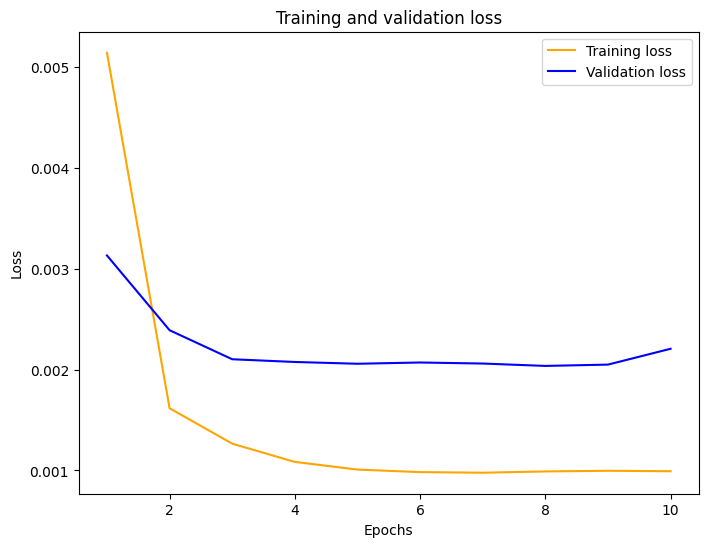

In [69]:
plot_curve(hist_0005)

In [70]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-10 15:24:00,0.538,0.327917,0.557475,0.555957,0.565388
1,2021-12-10 15:25:00,0.588,0.327917,0.533390,0.538442,0.549197
2,2021-12-10 15:26:00,0.566,0.327917,0.596515,0.596009,0.602362
3,2021-12-10 15:27:00,0.562,0.327917,0.555517,0.566590,0.575874
4,2021-12-10 15:28:00,0.612,0.327917,0.563879,0.565519,0.573204
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.327917,0.160701,0.169782,0.184300
3009,2021-12-16 13:59:00,0.169,0.327917,0.160836,0.169675,0.184186
3010,2021-12-16 14:00:00,0.147,0.327917,0.161907,0.170714,0.185145
3011,2021-12-16 14:01:00,0.145,0.327917,0.138723,0.148532,0.164458


In [71]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [79]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_0005)

Better MSE value is :  0.0020086448581532516


,Model,MSE error
0,model,0.002009
1,model_1,0.002194


In [73]:
data5 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_0005}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_20492\1559378114.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,10,Adam,32,,50,,,,,1,10,0.002009
1,10,RMSprop,32,,50,,,,,1,10,0.002068
2,10,Adam,64,,50,,,,,1,10,0.002621
3,10,Adam,32,0.1,50,,,,,1,10,0.086487
4,10,Adam,32,0.05,50,,,,,1,10,0.002109
5,10,Adam,32,0.01,50,,,,,1,10,0.002066
6,10,Adam,32,0.005,50,,,,,1,10,0.002194


----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [74]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 11s 12ms/step - loss: 0.0077 - val_loss: 0.0039
Epoch 2/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0025 - val_loss: 0.0033
Epoch 3/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0019 - val_loss: 0.0030
Epoch 4/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0017 - val_loss: 0.0026
Epoch 5/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 6/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 7/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.0024
Epoch 9/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0010 - val_loss: 0.

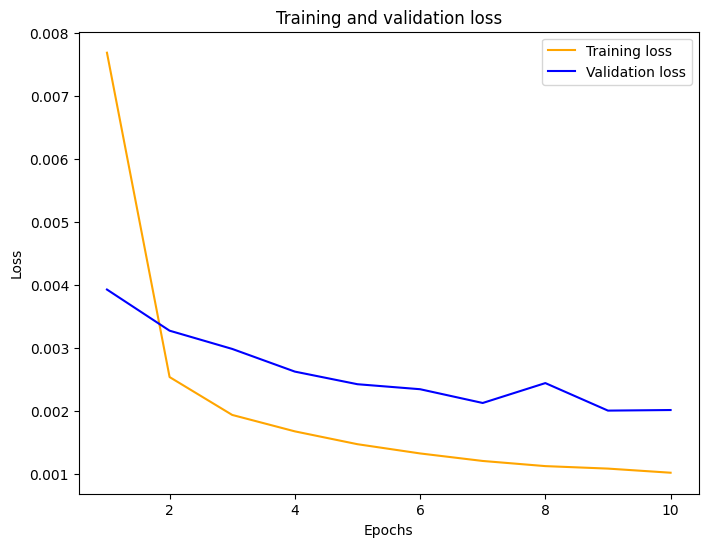

In [75]:
plot_curve(hist_0001)

In [76]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

95/95 [==============================] - 0s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-10 15:24:00,0.538,0.327917,0.557475,0.555957,0.565388,0.555957
1,2021-12-10 15:25:00,0.588,0.327917,0.533390,0.538442,0.549197,0.538442
2,2021-12-10 15:26:00,0.566,0.327917,0.596515,0.596009,0.602362,0.596009
3,2021-12-10 15:27:00,0.562,0.327917,0.555517,0.566590,0.575874,0.566590
4,2021-12-10 15:28:00,0.612,0.327917,0.563879,0.565519,0.573204,0.565519
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.327917,0.160701,0.169782,0.184300,0.169782
3009,2021-12-16 13:59:00,0.169,0.327917,0.160836,0.169675,0.184186,0.169675
3010,2021-12-16 14:00:00,0.147,0.327917,0.161907,0.170714,0.185145,0.170714
3011,2021-12-16 14:01:00,0.145,0.327917,0.138723,0.148532,0.164458,0.148532


In [77]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [80]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_0001)

Better MSE value is :  0.0020086448581532516


,Model,MSE error
0,model,0.002009
1,model_1,0.002066


In [81]:
data6 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.001, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_0001}]

mse_data = mse_data.append(data6,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_20492\1971936632.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,10,Adam,32,,50,,,,,1,10,0.002009
1,10,RMSprop,32,,50,,,,,1,10,0.002068
2,10,Adam,64,,50,,,,,1,10,0.002621
3,10,Adam,32,0.1,50,,,,,1,10,0.086487
4,10,Adam,32,0.05,50,,,,,1,10,0.002109
5,10,Adam,32,0.01,50,,,,,1,10,0.002066
6,10,Adam,32,0.005,50,,,,,1,10,0.002194
7,10,Adam,32,0.001,50,,,,,1,10,0.002066


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [82]:
test3 = test.copy()

In [83]:
test3['LSTM_50'] = predict_adam

In [84]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
model_1.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 12s 16ms/step - loss: 0.0072 - val_loss: 0.0036
Epoch 2/10
377/377 [==============================] - 5s 13ms/step - loss: 0.0023 - val_loss: 0.0033
Epoch 3/10
377/377 [==============================] - 5s 12ms/step - loss: 0.0019 - val_loss: 0.0028
Epoch 4/10
377/377 [==============================] - 5s 13ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 5/10
377/377 [==============================] - 5s 13ms/step - loss: 0.0014 - val_loss: 0.0024
Epoch 6/10
377/377 [==============================] - 5s 14ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 7/10
377/377 [==============================] - 5s 12ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 5s 13ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 5s 12ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 5s 13ms/step - loss: 9.8593e-04 - v

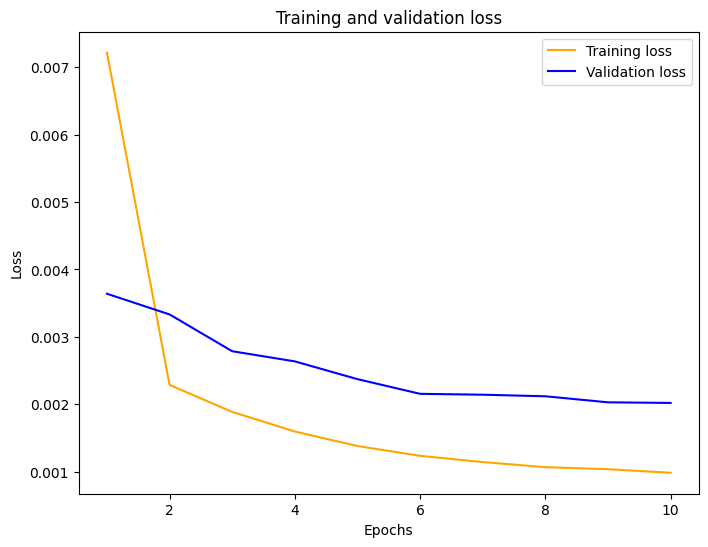

In [85]:
plot_curve(hist_1)

In [86]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

95/95 [==============================] - 2s 8ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-10 15:24:00,0.538,0.554377,0.555214
1,2021-12-10 15:25:00,0.588,0.537752,0.539674
2,2021-12-10 15:26:00,0.566,0.579857,0.587861
3,2021-12-10 15:27:00,0.562,0.573398,0.570003
4,2021-12-10 15:28:00,0.612,0.564369,0.563108
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.167777,0.167247
3009,2021-12-16 13:59:00,0.169,0.167347,0.166860
3010,2021-12-16 14:00:00,0.147,0.167881,0.167628
3011,2021-12-16 14:01:00,0.145,0.153338,0.149946


In [87]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [88]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_100)

Better MSE value is :  0.0020086448581532516


,Model,MSE error
0,model,0.002009
1,model_1,0.002011


In [89]:
data7 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 100, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_100}]

mse_data = mse_data.append(data7,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_20492\1529461219.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,10,Adam,32,,50,,,,,1,10,0.002009
1,10,RMSprop,32,,50,,,,,1,10,0.002068
2,10,Adam,64,,50,,,,,1,10,0.002621
3,10,Adam,32,0.1,50,,,,,1,10,0.086487
4,10,Adam,32,0.05,50,,,,,1,10,0.002109
5,10,Adam,32,0.01,50,,,,,1,10,0.002066
6,10,Adam,32,0.005,50,,,,,1,10,0.002194
7,10,Adam,32,0.001,50,,,,,1,10,0.002066
8,10,Adam,32,,100,,,,,1,10,0.002011


------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [90]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
model_2.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 11s 12ms/step - loss: 0.0227 - val_loss: 0.0048
Epoch 2/10
377/377 [==============================] - 4s 11ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 3/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 4/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0032 - val_loss: 0.0033
Epoch 5/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0029 - val_loss: 0.0030
Epoch 6/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0026 - val_loss: 0.0028
Epoch 7/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 8/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0023 - val_loss: 0.0024
Epoch 9/10
377/377 [==============================] - 4s 11ms/step - loss: 0.0021 - val_loss: 0.0024
Epoch 10/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0020 - val_loss: 

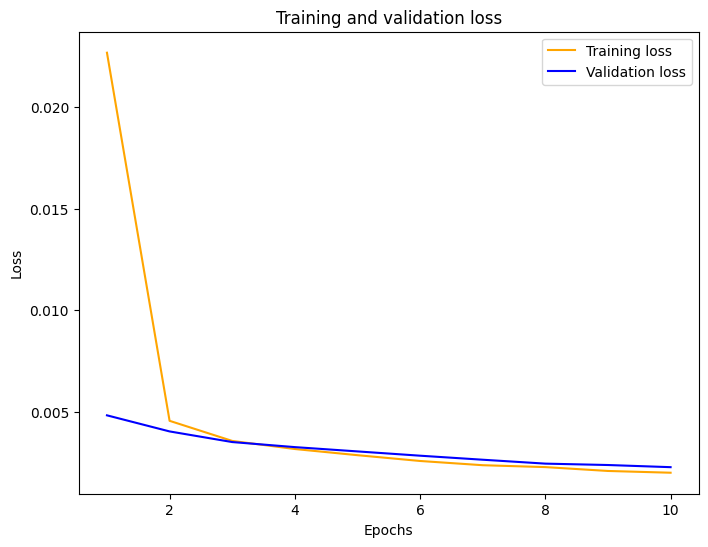

In [91]:
plot_curve(hist_2)

In [92]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-10 15:24:00,0.538,0.554377,0.555214,0.559663
1,2021-12-10 15:25:00,0.588,0.537752,0.539674,0.532291
2,2021-12-10 15:26:00,0.566,0.579857,0.587861,0.552538
3,2021-12-10 15:27:00,0.562,0.573398,0.570003,0.562381
4,2021-12-10 15:28:00,0.612,0.564369,0.563108,0.562957
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.167777,0.167247,0.166514
3009,2021-12-16 13:59:00,0.169,0.167347,0.166860,0.166416
3010,2021-12-16 14:00:00,0.147,0.167881,0.167628,0.166840
3011,2021-12-16 14:01:00,0.145,0.153338,0.149946,0.157351


In [93]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [94]:
lstm_mse_error_50_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_50_drop_out)

Better MSE value is :  0.0020086448581532516


,Model,MSE error
0,model,0.002009
1,model_1,0.002259


In [95]:
data8 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':0.1, 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_50_drop_out}]

mse_data = mse_data.append(data8,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_20492\499523592.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,10,Adam,32,,50,,,,,1,10,0.002009
1,10,RMSprop,32,,50,,,,,1,10,0.002068
2,10,Adam,64,,50,,,,,1,10,0.002621
3,10,Adam,32,0.1,50,,,,,1,10,0.086487
4,10,Adam,32,0.05,50,,,,,1,10,0.002109
5,10,Adam,32,0.01,50,,,,,1,10,0.002066
6,10,Adam,32,0.005,50,,,,,1,10,0.002194
7,10,Adam,32,0.001,50,,,,,1,10,0.002066
8,10,Adam,32,,100,,,,,1,10,0.002011
9,10,Adam,32,,50,0.1,,,,1,10,0.002259


------------------------------------

### Add frist layer: units = 50 and Add second layer: unit = 50

In [96]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
model_3.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 23s 29ms/step - loss: 0.0102 - val_loss: 0.0046
Epoch 2/10
377/377 [==============================] - 6s 15ms/step - loss: 0.0031 - val_loss: 0.0035
Epoch 3/10
377/377 [==============================] - 6s 15ms/step - loss: 0.0022 - val_loss: 0.0034
Epoch 4/10
377/377 [==============================] - 6s 15ms/step - loss: 0.0019 - val_loss: 0.0026
Epoch 5/10
377/377 [==============================] - 6s 15ms/step - loss: 0.0015 - val_loss: 0.0023
Epoch 6/10
377/377 [==============================] - 6s 15ms/step - loss: 0.0012 - val_loss: 0.0023
Epoch 7/10
377/377 [==============================] - 6s 15ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 8/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0011 - val_loss: 0.0023
Epoch 9/10
377/377 [==============================] - 6s 15ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 6s 15ms/step - loss: 0.0010 - val_l

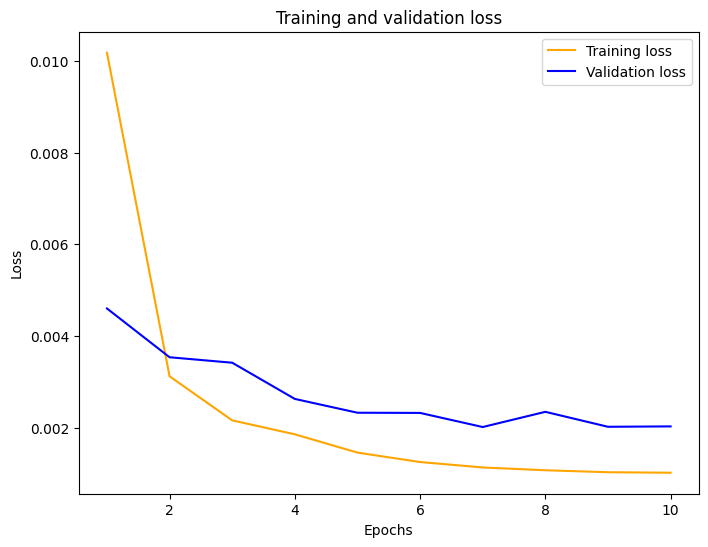

In [97]:
plot_curve(hist_3)

In [98]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

95/95 [==============================] - 2s 6ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-10 15:24:00,0.538,0.554377,0.555214,0.559663,0.547413
1,2021-12-10 15:25:00,0.588,0.537752,0.539674,0.532291,0.531231
2,2021-12-10 15:26:00,0.566,0.579857,0.587861,0.552538,0.583801
3,2021-12-10 15:27:00,0.562,0.573398,0.570003,0.562381,0.561501
4,2021-12-10 15:28:00,0.612,0.564369,0.563108,0.562957,0.557248
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.167777,0.167247,0.166514,0.170244
3009,2021-12-16 13:59:00,0.169,0.167347,0.166860,0.166416,0.170045
3010,2021-12-16 14:00:00,0.147,0.167881,0.167628,0.166840,0.170938
3011,2021-12-16 14:01:00,0.145,0.153338,0.149946,0.157351,0.151477


In [99]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [100]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_second_layer)

Better MSE value is :  0.0020086448581532516


,Model,MSE error
0,model,0.002009
1,model_1,0.002015


In [102]:
data10 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':50, 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_second_layer}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_20492\860904663.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,10,Adam,32,,50,,,,,1,10,0.002009
1,10,RMSprop,32,,50,,,,,1,10,0.002068
2,10,Adam,64,,50,,,,,1,10,0.002621
3,10,Adam,32,0.1,50,,,,,1,10,0.086487
4,10,Adam,32,0.05,50,,,,,1,10,0.002109
5,10,Adam,32,0.01,50,,,,,1,10,0.002066
6,10,Adam,32,0.005,50,,,,,1,10,0.002194
7,10,Adam,32,0.001,50,,,,,1,10,0.002066
8,10,Adam,32,,100,,,,,1,10,0.002011
9,10,Adam,32,,50,0.1,,,,1,10,0.002259


---

### Add frist layer: units = 50 and change epochs from 10 to 20

In [103]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
model_5.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 20, batch_size = 32)

Epoch 1/20
377/377 [==============================] - 8s 10ms/step - loss: 0.0098 - val_loss: 0.0040
Epoch 2/20
377/377 [==============================] - 3s 7ms/step - loss: 0.0025 - val_loss: 0.0031
Epoch 3/20
377/377 [==============================] - 3s 7ms/step - loss: 0.0020 - val_loss: 0.0028
Epoch 4/20
377/377 [==============================] - 3s 7ms/step - loss: 0.0017 - val_loss: 0.0027
Epoch 5/20
377/377 [==============================] - 2s 6ms/step - loss: 0.0015 - val_loss: 0.0025
Epoch 6/20
377/377 [==============================] - 3s 7ms/step - loss: 0.0014 - val_loss: 0.0024
Epoch 7/20
377/377 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 8/20
377/377 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 9/20
377/377 [==============================] - 2s 7ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 10/20
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.002

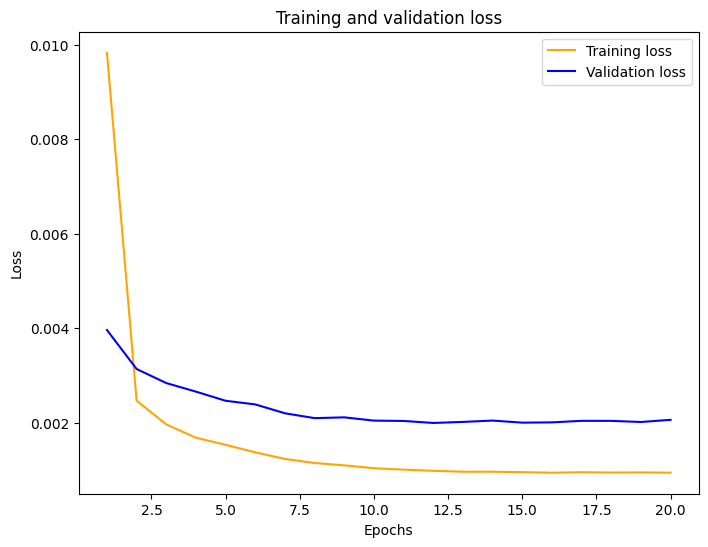

In [104]:
plot_curve(hist_5)

In [105]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch20'] = predict_5
test3

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_epoch20
0,2021-12-10 15:24:00,0.538,0.554377,0.555214,0.559663,0.547413,0.560756
1,2021-12-10 15:25:00,0.588,0.537752,0.539674,0.532291,0.531231,0.543945
2,2021-12-10 15:26:00,0.566,0.579857,0.587861,0.552538,0.583801,0.595543
3,2021-12-10 15:27:00,0.562,0.573398,0.570003,0.562381,0.561501,0.571813
4,2021-12-10 15:28:00,0.612,0.564369,0.563108,0.562957,0.557248,0.568497
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.167777,0.167247,0.166514,0.170244,0.175913
3009,2021-12-16 13:59:00,0.169,0.167347,0.166860,0.166416,0.170045,0.175857
3010,2021-12-16 14:00:00,0.147,0.167881,0.167628,0.166840,0.170938,0.176796
3011,2021-12-16 14:01:00,0.145,0.153338,0.149946,0.157351,0.151477,0.156017


In [106]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch20'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [107]:
lstm_mse_error_unit_50_epoch20 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch20'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_epoch20)

Better MSE value is :  0.0020086448581532516


,Model,MSE error
0,model,0.002009
1,model_1,0.002054


In [108]:
data11 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':20 ,'mse error':lstm_mse_error_unit_50_epoch20}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_20492\2720828979.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,10,Adam,32,,50,,,,,1,10,0.002009
1,10,RMSprop,32,,50,,,,,1,10,0.002068
2,10,Adam,64,,50,,,,,1,10,0.002621
3,10,Adam,32,0.1,50,,,,,1,10,0.086487
4,10,Adam,32,0.05,50,,,,,1,10,0.002109
5,10,Adam,32,0.01,50,,,,,1,10,0.002066
6,10,Adam,32,0.005,50,,,,,1,10,0.002194
7,10,Adam,32,0.001,50,,,,,1,10,0.002066
8,10,Adam,32,,100,,,,,1,10,0.002011
9,10,Adam,32,,50,0.1,,,,1,10,0.002259


---

# save model

In [109]:
mse_lstm = pd.read_csv('data_lstm_mse.csv')
mse_lstm

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.002492
5,5,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.002080
6,5,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.002007
7,5,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.002080
8,5,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987


In [110]:
mse_data

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,10,Adam,32,,50,,,,,1,10,0.002009
1,10,RMSprop,32,,50,,,,,1,10,0.002068
2,10,Adam,64,,50,,,,,1,10,0.002621
3,10,Adam,32,0.1,50,,,,,1,10,0.086487
4,10,Adam,32,0.05,50,,,,,1,10,0.002109
5,10,Adam,32,0.01,50,,,,,1,10,0.002066
6,10,Adam,32,0.005,50,,,,,1,10,0.002194
7,10,Adam,32,0.001,50,,,,,1,10,0.002066
8,10,Adam,32,,100,,,,,1,10,0.002011
9,10,Adam,32,,50,0.1,,,,1,10,0.002259


In [112]:
mse_lags = pd.concat([mse_lstm,mse_data],ignore_index=True)
mse_lags

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.1,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.05,50,NaN,NaN,NaN,NaN,1,10,0.002492
5,5,Adam,32,0.01,50,NaN,NaN,NaN,NaN,1,10,0.002080
6,5,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.002007
7,5,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.002080
8,5,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987


In [113]:
mse_lags.to_csv('data_lstm_mse.csv',index=False)

In [114]:
mse_lstm1 = pd.read_csv('data_lstm_mse.csv')
mse_lstm1

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.002492
5,5,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.002080
6,5,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.002007
7,5,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.002080
8,5,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987


In [115]:
mse = mse_lstm1.groupby(['Lags'])['mse error'].transform(min) == mse_lstm1['mse error']
mse_lstm1[mse]

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987
13,10,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002009


In [ ]:
model_50_adam.save('model_train_80%_lag10.h5')